In [2]:
## Load libraries
import pystac_client
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import dask.dataframe as dd
import planetary_computer
import dask_geopandas as dgpd


In [3]:
%run helper.ipynb

## Global Variables

### Grid Size

In WGS84: lat/lon
- Rule of thumb: 1 deg lon/lat (atleast near the equator for lat, always for lon) = 111km
- e.g. round the inherent lat/lons to 2 decimal points (82.37654 -> 82.38) will align all points to 0.01 degrees (or approx 1.11km apart)

In [7]:
gateway.list_clusters()

[]

In [8]:
check_for_existing_clusters()

False

In [9]:
setup_dask_cluster()

<Client: 'tls://10.244.17.138:8786' processes=0 threads=0, memory=0 B>
https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.040aeb19baf9464bbcc3a86d0042c1b0/status


In [10]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
)
search = catalog.search(collections=["gbif"])
items = search.get_all_items()
items = {x.id: x for x in items}
item = list(items.values())[0]
item

<Item id=gbif-2022-03-01>

In [11]:
keep_cols= ['gbifid', 'datasetkey', 'occurrenceid', 'kingdom', 'phylum', 'class',\
       'order', 'family', 'genus', 'species','countrycode', 'locality',\
       'stateprovince', 'individualcount','decimallatitude', 'decimallongitude',\
       'coordinateuncertaintyinmeters', 'coordinateprecision', 'elevation',\
       'elevationaccuracy', 'depth', 'depthaccuracy', 'eventdate', 'day',
       'month', 'year', 'taxonkey', 'basisofrecord', 'issue', 'occurrencestatus']


In [12]:
min_cols = ['species','genus','individualcount','countrycode','decimallatitude', 'decimallongitude','basisofrecord', 'issue', 'occurrencestatus']

Load a dask frame with the pointer to the GBIF data

In [13]:
signed_asset = planetary_computer.sign(item).assets["data"]

ddf = dd.read_parquet(
    signed_asset.href,
    columns = min_cols,
    storage_options=signed_asset.extra_fields["table:storage_options"],
    dataset={"require_extension": None},
)
ddf.npartitions

1105

In [14]:
ddf.head()

,species,genus,individualcount,countrycode,decimallatitude,decimallongitude,basisofrecord,issue,occurrencestatus
0,Cymbopogon bombycinus,Cymbopogon,NaN,AU,-23.8500,151.2500,PRESERVED_SPECIMEN,"[INSTITUTION_MATCH_FUZZY, COLLECTION_MATCH_FUZZY]",PRESENT
1,Eremophila elderi,Eremophila,NaN,AU,-23.3167,130.3667,PRESERVED_SPECIMEN,"[INSTITUTION_MATCH_FUZZY, COLLECTION_MATCH_FUZZY]",PRESENT
2,Carex chlorantha,Carex,NaN,AU,-37.7000,148.4500,PRESERVED_SPECIMEN,"[INSTITUTION_MATCH_FUZZY, COLLECTION_MATCH_FUZZY]",PRESENT
3,Philonotis tenuis,Philonotis,NaN,AU,-35.8667,148.5000,PRESERVED_SPECIMEN,"[INSTITUTION_MATCH_FUZZY, COLLECTION_MATCH_FUZZY]",PRESENT
4,Senecio pinnatifolius,Senecio,NaN,AU,-37.5667,149.7500,PRESERVED_SPECIMEN,"[INSTITUTION_MATCH_FUZZY, COLLECTION_MATCH_FUZZY]",PRESENT


## Filter GBIF data
Possibbasisofrecordilters:
- Countrycode (CR)
- coordinateuncertaintyinmeters (< some number like 1000 or 10000m)
- dateidentified (some minimum date)
- Kingdom/Phylum/class/order/..
- Remove fossils (basisofrecord != 'FOSSIL_SPECIMEN') [Basis of Record explainer](https://gbif.github.io/gbif-api/apidocs/org/gbif/api/vocabulary/BasisOfRecord.html)
- occurrencestatus == 'PRESENT'

Maybe:
- taxonkey = 212 for all birds, etc


The Parquet file schema is described below.  Most field names correspond to [terms from the Darwin Core standard](https://dwc.tdwg.org/terms/), and have been interpreted by GBIF's systems to align taxonomy, location, dates etc.
Additional information may be retrived using the [GBIF API](https://www.gbif.org/developer/summary).

|              Field¹              |     Type      | Nullable | Description                   |
|----------------------------------|---------------|----------|-------------------------------|
| gbifid                           | BigInt        | N        | GBIF's identifier for the occurrence |
| datasetkey                       | String (UUID) | N        | GBIF's UUID for the [dataset](https://www.gbif.org/developer/registry#datasets) containing this occurrence |
| publishingorgkey                 | String (UUID) | N        | GBIF's UUID for the [organization](https://www.gbif.org/developer/registry#organizations) publishing this occurrence. |
| occurrencestatus                 | String        | N        | See [dwc:occurrenceStatus](https://dwc.tdwg.org/terms/#occurrenceStatus). Either the value `PRESENT` or `ABSENT`.  Many users will wish to filter for `PRESENT` data. |
| basisofrecord                    | String        | N        | See [dwc:basisOfRecord](https://dwc.tdwg.org/terms/#basisOfRecord).  One of `PRESERVED_SPECIMEN`, `FOSSIL_SPECIMEN`, `LIVING_SPECIMEN`, `OBSERVATION`, `HUMAN_OBSERVATION`, `MACHINE_OBSERVATION`, `MATERIAL_SAMPLE`, `LITERATURE`, `UNKNOWN`. |
| kingdom                          | String        | Y        | See [dwc:kingdom](https://dwc.tdwg.org/terms/#kingdom).  This field has been aligned with the [GBIF backbone taxonomy](https://doi.org/10.15468/39omei). |
| phylum                           | String        | Y        | See [dwc:phylum](https://dwc.tdwg.org/terms/#phylum).  This field has been aligned with the GBIF backbone taxonomy. |
| class                            | String        | Y        | See [dwc:class](https://dwc.tdwg.org/terms/#class).  This field has been aligned with the GBIF backbone taxonomy. |
| order                            | String        | Y        | See [dwc:order](https://dwc.tdwg.org/terms/#order).  This field has been aligned with the GBIF backbone taxonomy. |
| family                           | String        | Y        | See [dwc:family](https://dwc.tdwg.org/terms/#family).  This field has been aligned with the GBIF backbone taxonomy. |
| genus                            | String        | Y        | See [dwc:genus](https://dwc.tdwg.org/terms/#genus).  This field has been aligned with the GBIF backbone taxonomy. |
| species                          | String        | Y        | See [dwc:species](https://dwc.tdwg.org/terms/#species).  This field has been aligned with the GBIF backbone taxonomy. |
| infraspecificepithet             | String        | Y        | See [dwc:infraspecificEpithet](https://dwc.tdwg.org/terms/#infraspecificEpithet).  This field has been aligned with the GBIF backbone taxonomy. |
| taxonrank                        | String        | Y        | See [dwc:taxonRank](https://dwc.tdwg.org/terms/#taxonRank).  This field has been aligned with the GBIF backbone taxonomy. |
| scientificname                   | String        | Y        | See [dwc:scientificName](https://dwc.tdwg.org/terms/#scientificName).  This field has been aligned with the GBIF backbone taxonomy. |
| verbatimscientificname           | String        | Y        | The scientific name as provided by the data publisher |
| verbatimscientificnameauthorship | String        | Y        | The scientific name authorship provided by the data publisher. |
| taxonkey                         | Integer       | Y        | The numeric identifier for the [taxon](https://www.gbif.org/developer/species#nameUsages) in GBIF's backbone taxonomy corresponding to `scientificname`. |
| specieskey                       | Integer       | Y        | The numeric identifier for the taxon in GBIF's backbone taxonomy corresponding to `species`. |
| typestatus                       | String        | Y        | See [dwc:typeStatus](https://dwc.tdwg.org/terms/#typeStatus). |
| countrycode                      | String        | Y        | See [dwc:countryCode](https://dwc.tdwg.org/terms/#countryCode).  GBIF's interpretation has set this to an ISO 3166-2 code. |
| locality                         | String        | Y        | See [dwc:locality](https://dwc.tdwg.org/terms/#locality). |
| stateprovince                    | String        | Y        | See [dwc:stateProvince](https://dwc.tdwg.org/terms/#stateProvince). |
| decimallatitude                  | Double        | Y²       | See [dwc:decimalLatitude](https://dwc.tdwg.org/terms/#decimalLatitude).  GBIF's interpretation has normalized this to a WGS84 coordinate. |
| decimallongitude                 | Double        | Y²       | See [dwc:decimalLongitude](https://dwc.tdwg.org/terms/#decimalLongitude).  GBIF's interpretation has normalized this to a WGS84 coordinate. |
| coordinateuncertaintyinmeters    | Double        | Y        | See [dwc:coordinateUncertaintyInMeters](https://dwc.tdwg.org/terms/#coordinateUncertaintyInMeters). |
| coordinateprecision              | Double        | Y        | See [dwc:coordinatePrecision](https://dwc.tdwg.org/terms/#coordinatePrecision). |
| elevation                        | Double        | Y        | See [dwc:elevation](https://dwc.tdwg.org/terms/#elevation).  If provided by the data publisher, GBIF's interpretation has normalized this value to metres. |
| elevationaccuracy                | Double        | Y        | See [dwc:elevationAccuracy](https://dwc.tdwg.org/terms/#elevationAccuracy).  If provided by the data publisher, GBIF's interpretation has normalized this value to metres. |
| depth                            | Double        | Y        | See [dwc:depth](https://dwc.tdwg.org/terms/#depth).  If provided by the data publisher, GBIF's interpretation has normalized this value to metres. |
| depthaccuracy                    | Double        | Y        | See [dwc:depthAccuracy](https://dwc.tdwg.org/terms/#depthAccuracy).  If provided by the data publisher, GBIF's interpretation has normalized this value to metres. |
| eventdate                        | String        | Y        | See [dwc:eventDate](https://dwc.tdwg.org/terms/#eventDate).  GBIF's interpretation has normalized this value to an ISO 8601 date with a local time. |
| year                             | Integer       | Y        | See [dwc:year](https://dwc.tdwg.org/terms/#year). |
| month                            | Integer       | Y        | See [dwc:month](https://dwc.tdwg.org/terms/#month). |
| day                              | Integer       | Y        | See [dwc:day](https://dwc.tdwg.org/terms/#day). |
| individualcount                  | Integer       | Y        | See [dwc:individualCount](https://dwc.tdwg.org/terms/#individualCount). |
| establishmentmeans               | String        | Y        | See [dwc:establishmentMeans](https://dwc.tdwg.org/terms/#establishmentMeans). |
| occurrenceid                     | String        | Y³       | See [dwc:occurrenceID](https://dwc.tdwg.org/terms/#occurrenceID). |
| institutioncode                  | String        | Y³       | See [dwc:institutionCode](https://dwc.tdwg.org/terms/#institutionCode). |
| collectioncode                   | String        | Y³       | See [dwc:collectionCode](https://dwc.tdwg.org/terms/#collectionCode). |
| catalognumber                    | String        | Y³       | See [dwc:catalogNumber](https://dwc.tdwg.org/terms/#catalogNumber). |
| recordnumber                     | String        | Y        | See [dwc:recordNumber](https://dwc.tdwg.org/terms/#recordNumber). |
| recordedby                       | String        | Y        | See [dwc:recordedBy](https://dwc.tdwg.org/terms/#recordedBy). |
| identifiedby                     | String        | Y        | See [dwc:identifiedBy](https://dwc.tdwg.org/terms/#identifiedBy). |
| dateidentified                   | String        | Y        | See [dwc:dateIdentified](https://dwc.tdwg.org/terms/#dateIdentified). An ISO 8601 date. |
| mediatype                        | String array  | N⁴       | See [dwc:mediaType](https://dwc.tdwg.org/terms/#mediaType).  May contain `StillImage`, `MovingImage` or `Sound` (from [enumeration](http://api.gbif.org/v1/enumeration/basic/MediaType), detailing whether the occurrence has this media available. |
| issue                            | String array  | N⁴       | A list of [issues](https://gbif.github.io/gbif-api/apidocs/org/gbif/api/vocabulary/OccurrenceIssue.html) encountered by GBIF in processing this record. More details are available on these issues and flags in [this blog post](https://data-blog.gbif.org/post/issues-and-flags/).|
| license                          | String        | N        | See [dwc:license](https://dwc.tdwg.org/terms/#license). Either [`CC0_1_0`](https://creativecommons.org/publicdomain/zero/1.0/) or [`CC_BY_4_0`](https://creativecommons.org/licenses/by/4.0/).  `CC_BY_NC_4_0` records are not present in this snapshot. |
| rightsholder                     | String        | Y        | See [dwc:rightsHolder](https://dwc.tdwg.org/terms/#rightsHolder). |
| lastinterpreted                  | String        | N        | The ISO 8601 date when the record was last processed by GBIF. Data are reprocessed for several reasons, including changes to the backbone taxonomy, so this date is not necessarily the date the occurrence record last changed. |

¹ Field names are lower case, but in later snapshots this may change to camelCase, for consistency with Darwin Core and the GBIF API.

² Occurrences without coordinates are excluded from this snapshot, although this may change in the future.

³ Either `occurrenceID`, or `institutionCode` + `collectionCode` + `catalogNumber`, or both, will be present on every record.

⁴ The array may be empty.


In [15]:
gbif_cr = ddf.loc[ddf.countrycode == 'CR']

In [16]:
gbif_cr = gbif_cr.loc[gbif_cr.basisofrecord != 'FOSSIL_SPECIMEN']
gbif_cr = gbif_cr.loc[gbif_cr.occurrencestatus == 'PRESENT']


In [15]:
#Dont do it, requires a .compute and will take a looong time
#len(gbif_cr.index)

### Drop Columns

Consider keeping ['issue'](https://gbif.github.io/gbif-api/apidocs/org/gbif/api/vocabulary/OccurrenceIssue.html) for later filtering

In [17]:
gbif_cr_min = gbif_cr.drop(['basisofrecord','occurrencestatus','issue'], axis=1)

In [18]:
gbif_cr_min.columns

Index(['species', 'genus', 'individualcount', 'countrycode', 'decimallatitude',
       'decimallongitude'],
      dtype='object')

In [18]:
#sanity check
# df = gbif_cr_min.drop(['genus','decimallatitude','decimallongitude'], axis=1)
# species_per_country = df.groupby("countrycode").species.nunique()
# species_per_country

In [19]:
# species_per_country_df = species_per_country.compute()

In [19]:
# setup_dask_cluster()
gbif_cr_min

,species,genus,individualcount,countrycode,decimallatitude,decimallongitude
npartitions=1105,,,,,,
,object,object,int32,object,float64,float64
,...,...,...,...,...,...
...,...,...,...,...,...,...
,...,...,...,...,...,...
,...,...,...,...,...,...


### Reduce resolution

Use a dirty trick of reducing the number of decimal points to align a point to some closest lat/lon line. Using grid_size * round(lat/grid_size) to align to any arbitrary grid size



In [20]:
gbif_cr_min_round = reduce_resolution_any(gbif_cr_min,['decimallatitude','decimallongitude'], grid_size)
gbif_cr_min_round

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/dataframe/core.py:5006: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta={'decimallatitude': 'float64', 'decimallongitude': 'float64'})

  warnings.warn(meta_warning(meta))


,species,genus,individualcount,countrycode,decimallatitude,decimallongitude
npartitions=1105,,,,,,
,object,object,int32,object,float64,float64
,...,...,...,...,...,...
...,...,...,...,...,...,...
,...,...,...,...,...,...
,...,...,...,...,...,...


### Derive numerical values for species richness


We will be focusing on alpha specied richness, which is simply the count of unique species within a given region.
Here the region is our chosen grid size.

In [27]:
nunique = dd.Aggregation(name="nunique", chunk=lambda s: s.apply(lambda x: list(set(x))),\
    agg=lambda s0: s0.obj.groupby(level=list(range(s0.obj.index.nlevels))).sum(),\
    finalize=lambda s1: s1.apply(lambda final: len(set(final))))

#cr_species = gbif_cr_min_round.groupby(['decimallatitude','decimallongitude']).species.nunique().reset_index()
cr_species = gbif_cr_min_round.groupby(['decimallatitude','decimallongitude'])\
.aggregate({'species' : nunique, 'individualcount' : 'sum', 'countrycode': 'count'}).reset_index()


In [28]:
cr_species = cr_species.rename(columns = {'countrycode' : 'numobservations'})

In [29]:
#Not required
#cr_species.drop_duplicates(subset=['decimallatitude','decimallongitude'], keep='last', inplace=True) 
cr_species

,decimallatitude,decimallongitude,species,individualcount,numobservations
npartitions=1,,,,,
,float64,float64,int64,int32,int64
,...,...,...,...,...


### Lets try out dask_geopandas

But first we have to convert to geopandas, sadly. I have not found a way to go from dask -> dask_geopandas, so:

1. dask -> geopandas

In [ ]:
setup_dask_cluster()
cr_species_gpd = gpd.GeoDataFrame(cr_species.compute(),\
                                  geometry=gpd.points_from_xy(cr_species['decimallongitude'],\
                                                              cr_species['decimallatitude']), crs = "EPSG:4326")

# cr_species_gpd = gpd.GeoDataFrame(cr_species,\
#                                   geometry=gpd.points_from_xy(cr_species['decimallongitude'],\
#                                                               cr_species['decimallatitude']), crs = "EPSG:4326")

In [26]:
cr_species_gpd

NameError: name 'cr_species_gpd' is not defined

In [40]:
cr_species_gpd_clean = cr_species_gpd.drop(columns=['decimallatitude','decimallongitude'])
cr_species_gpd_clean

,species,individualcount,numobservations,geometry
0,1,1.0,1,POINT (-86.31000 2.23000)
1,1,2.0,1,POINT (-86.35000 2.28000)
2,1,1.0,1,POINT (-85.89000 2.35000)
3,1,0.0,1,POINT (-86.53000 2.38000)
4,1,0.0,1,POINT (-85.88000 2.38000)
...,...,...,...,...
25417,1,4.0,4,POINT (-85.56000 11.21000)
25418,1,2.0,1,POINT (-82.87000 11.21000)
25419,36,310.0,72,POINT (-85.61000 11.22000)
25420,1,3.0,1,POINT (-82.92000 11.23000)


### Write or read to save cycles on rerun

Uncomment to read or write

In [41]:
# cr_species_gpd_clean.to_parquet('cr_species_gpd_clean.parquet')
# cr_species_gpd_clean.to_file('cr_species_gpd_clean.shp')

/srv/conda/envs/notebook/lib/python3.8/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/tmp/ipykernel_359/2538514284.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  cr_species_gpd_clean.to_file('cr_species_gpd_clean.shp')


In [4]:
cr_species_gpd_clean = gpd.read_file('cr_species_gpd_clean.shp')  

In [5]:
display(cr_species_gpd_clean,type(cr_species_gpd_clean))
#cr_species_gpd_clean.index.is_monotonic_increasing

,species,individual,numobserva,geometry
0,1,1.0,1,POINT (-86.31000 2.23000)
1,1,2.0,1,POINT (-86.35000 2.28000)
2,1,1.0,1,POINT (-85.89000 2.35000)
3,1,0.0,1,POINT (-86.53000 2.38000)
4,1,0.0,1,POINT (-85.88000 2.38000)
...,...,...,...,...
25417,1,4.0,4,POINT (-85.56000 11.21000)
25418,1,2.0,1,POINT (-82.87000 11.21000)
25419,36,310.0,72,POINT (-85.61000 11.22000)
25420,1,3.0,1,POINT (-82.92000 11.23000)


geopandas.geodataframe.GeoDataFrame

2. geopandas -> dask_geopandas

In [6]:

#spatial shuffle will organize the partitions spatially
cr_species_dgpd = dgpd.from_geopandas(cr_species_gpd_clean, npartitions=100)

In [7]:
cr_species_dgpd.head(20)

,species,individual,numobserva,geometry
0,1,1.0,1,POINT (-86.31000 2.23000)
1,1,2.0,1,POINT (-86.35000 2.28000)
2,1,1.0,1,POINT (-85.89000 2.35000)
3,1,0.0,1,POINT (-86.53000 2.38000)
4,1,0.0,1,POINT (-85.88000 2.38000)
5,1,0.0,1,POINT (-87.23000 2.42000)
6,1,1.0,1,POINT (-86.84000 2.45000)
7,1,1.0,1,POINT (-86.07000 2.47000)
8,1,1.0,1,POINT (-85.97000 2.52000)
9,1,1.0,1,POINT (-87.26000 2.53000)


In [8]:
### Move from point geometry to square geometry

### Assign each point to it's own square grid


Add a new column called geometry where we store the shapely polygons

In [9]:
setup_dask_cluster()
cr_species_dgpd_grid = get_gdf_with_grids(cr_species_dgpd, gsize=grid_size)
cr_species_dgpd_grid

<Client: 'tls://10.244.168.17:8786' processes=0 threads=0, memory=0 B>
https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.6ec94be5e80f4cfebb981f7aeca9173a/status


/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/dataframe/core.py:5006: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta=(None, 'object'))

  warnings.warn(meta_warning(meta))
/srv/conda/envs/notebook/lib/python3.8/site-packages/geopandas/geodataframe.py:1350: UserWarning: Geometry column does not contain geometry.
  warnings.warn("Geometry column does not contain geometry.")


,species,individual,numobserva,geometry
npartitions=100,,,,
0,int64,float64,int64,geometry
255,...,...,...,...
...,...,...,...,...
25245,...,...,...,...
25421,...,...,...,...


In [10]:
cr_species_dgpd_grid.head(5)

,species,individual,numobserva,geometry
0,1,1.0,1,"POLYGON ((-86.31500 2.22500, -86.31500 2.23500..."
1,1,2.0,1,"POLYGON ((-86.35500 2.27500, -86.35500 2.28500..."
2,1,1.0,1,"POLYGON ((-85.89500 2.34500, -85.89500 2.35500..."
3,1,0.0,1,"POLYGON ((-86.53500 2.37500, -86.53500 2.38500..."
4,1,0.0,1,"POLYGON ((-85.88500 2.37500, -85.88500 2.38500..."


#### Do some sanity checking by plotting

In [11]:
# slice5 = cr_species_ddf.partitions[5].compute()
slice5 = compute(cr_species_dgpd_grid.partitions[5])

Clusters already exist, latching onto the first one
<Client: 'tls://10.244.168.17:8786' processes=2 threads=2, memory=32.00 GiB>
https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.6ec94be5e80f4cfebb981f7aeca9173a/status


<AxesSubplot:>

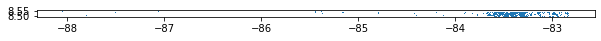

In [12]:
slice5.plot(markersize=0.01, figsize=(10,10))

### Intersect with the terrestrial polygon of Costa Rica

We want the grids for only terrestial costa rica, so for now, lets throw away the rest

### Get the hires polygon for CR

In [2]:
countries = gpd.read_file("https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson")
cr_vec_hires = countries[countries.ISO_A2 == 'CR']
cr_vec_hires

NameError: name 'gpd' is not defined

/srv/conda/envs/notebook/lib/python3.8/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<AxesSubplot:>

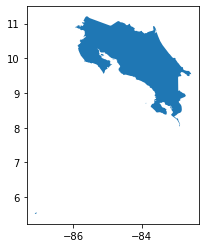

In [4]:


cr_vec_hires['geometry'] = cr_vec_hires['geometry'].set_crs("EPSG:4326")
cr_vec_hires.plot()

In [1]:
cr_vec_hires.geometry.bounds

NameError: name 'cr_vec_hires' is not defined

### Set a bounding box

Initially the idea was to exclude Cocos island or any other part, but it's not required. Left here for didactic purposes.


We manually trim the polygons by creating a bounding box

<AxesSubplot:>

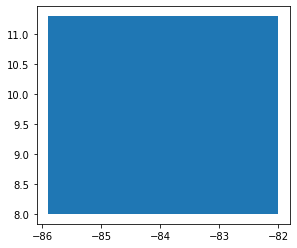

In [71]:
#Create a bounding box for terrestrial CR

from shapely.geometry import Polygon
import shapely as sh


lon_point_list = [-85.9, -82, -82, -85.9]
lat_point_list = [11.3, 11.3, 8, 8]

polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
crs = 'epsg:4326'
bounding_box = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom])
bounding_box.plot()

In [42]:
cr_terra = gpd.overlay(cr_vec_hires, bounding_box, how='intersection')
# intersecting = cr_polygon.sjoin(b_box_df, how='inner')['savedindex'] #Find the polygons that intersect. Keep savedindex as a series
cr_terra.plot()

NameError: name 'bounding_box' is not defined

In [46]:
cr_terra = cr_vec_hires

### Clip to terrestrial CR

In [16]:
cr_species_terra_gpdd = dgpd.clip(cr_species_dgpd_grid,cr_vec_hires)
cr_species_terra_gpdd

,species,individual,numobserva,geometry
npartitions=100,,,,
0,int64,float64,int64,geometry
255,...,...,...,...
...,...,...,...,...
25245,...,...,...,...
25421,...,...,...,...


In [17]:
#Parquet save needs some debug on PlanetaryComputer (PC) -> cannot write to disk, or rather empty folder is created
#cr_species_terra_gpdd.to_parquet('../data/cr_species_terra_gpdd.parquet')

## Map

Plot it

In [18]:

cr_species_richness_map = compute(cr_species_terra_gpdd)

Clusters already exist, latching onto the first one
<Client: 'tls://10.244.168.17:8786' processes=2 threads=2, memory=32.00 GiB>
https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.6ec94be5e80f4cfebb981f7aeca9173a/status


NameError: name 'cr_terra' is not defined

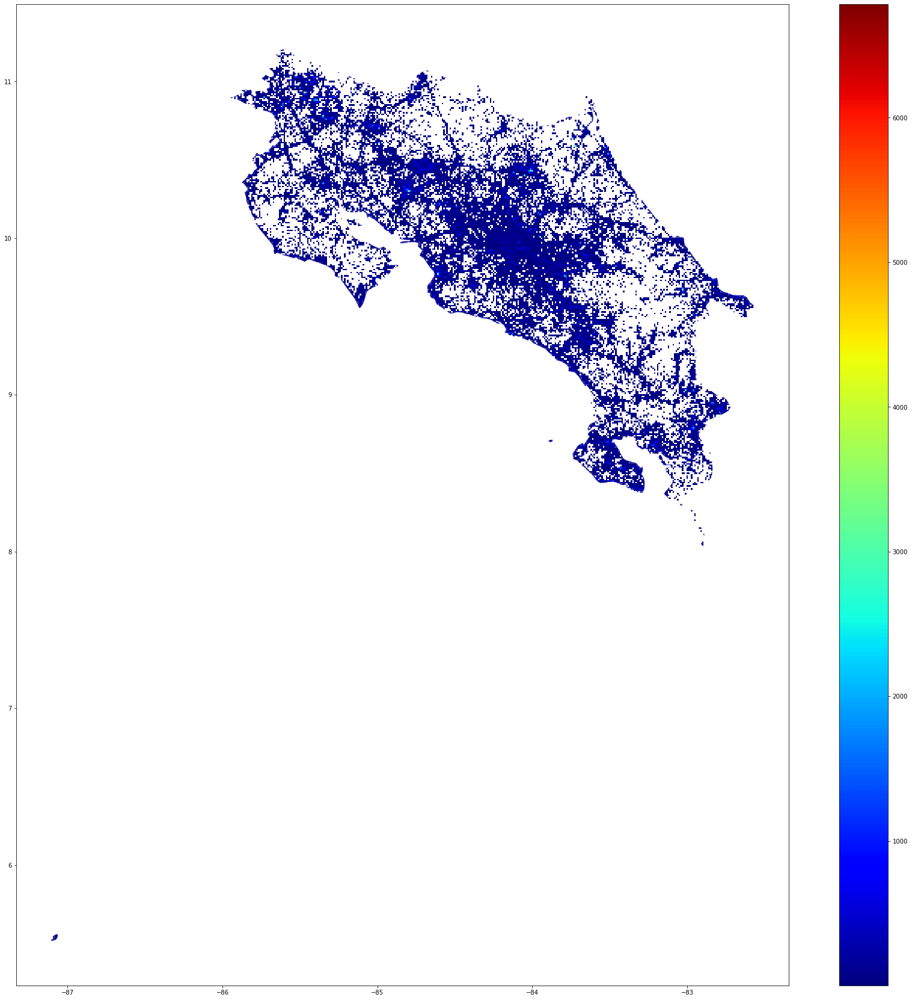

In [19]:
ax = cr_species_richness_map.plot(markersize=0.1, figsize=(30,30), column = 'species', cmap='jet', legend=True)
#Plot the borders
cr_terra.to_crs(cr_species_richness_map.crs).plot(ax=ax, color='none', edgecolor='black')
ax.axis('off')
ax.set_title('Species Richness Map for Costa Rica at 0.01 degree grids')
ax.plot()

### Interactive Map

In [21]:
import folium
# cr_basemap = folium.Map(location=cr_coods_center, tiles='OpenStreetMap' , zoom_start = 7)
cr_basemap = folium.Map(location=cr_coods_center, tiles='CartoDB positron' , zoom_start = 7)
cr_species_richness_map.explore(
    m = cr_basemap,
    column='species',
    tooltip=['species','numobserva', 'individual'],
    highlight=True,
    popup=True, # show all values in popup (on click)
    tiles="CartoDB positron", # use "CartoDB positron" tiles
    cmap="jet", # use "Set1" matplotlib colormap
    categorical = False,
    style_kwds=dict(color="black", apha=0.1, stroke=True) # use black outline
)

### Convert from point to raster

Using Geocube functions - failed on first tests, need to retry

In [79]:
import json
from functools import partial

from shapely.geometry import box, mapping

from geocube.api.core import make_geocube
from geocube.rasterize import rasterize_points_griddata, rasterize_points_radial

In [80]:

out_grid = make_geocube(vector_data=cr_species_richness_map, measurements=['species'], resolution=(-0.01, 0.01))# , \
                        #rasterize_function=partial(rasterize_points_griddata, method="cubic")) #for most crs negative comes first in resolution



In [82]:
# out_grid.test_attr.where(out_grid.test_attr!=out_grid.test_attr.rio.nodata).plot()
out_grid.rio.to_raster('cr_species.tif')
# out_grid["species"].rio.to_raster("my_rasterized_column.tif")

In [81]:
out_grid

<xarray.Dataset>
Dimensions:      (y: 318, x: 333)
Coordinates:
  * y            (y) float64 11.21 11.2 11.19 11.18 ... 8.065 8.055 8.045 8.035
  * x            (x) float64 -85.9 -85.89 -85.88 -85.87 ... -82.6 -82.59 -82.58
    spatial_ref  int64 0
Data variables:
    species      (y, x) float64 nan nan nan nan nan nan ... nan nan nan nan nan

In [ ]:
#slice5_grid = make_grid(slice5_clean, 0.009) #roughly 1kmx1km